# Pathway Analysis, GOEA - goatools

This is a memory-intensive notebook (based on goatools) i.e., might not run on a 16GB RAM machine.

In [ ]:
# try:
#     import varseek as vk
# except ImportError:
#     print("varseek not found, installing...")
#     !pip install -U -q varseek
# try:
#     import RLSRP_2025
# except ImportError:
#     print("RLSRP_2025 not found, installing...")
#     !pip install -q git+https://github.com/pachterlab/RLSRP_2025.git

In [1]:
import gget
import pandas as pd
import os
import shutil
import subprocess
import anndata as ad
from varseek.utils import convert_mutation_cds_locations_to_cdna

RLSRP_2025_dir = os.path.dirname(os.path.abspath(""))  # if this notebook resides in RLSRP_2025/notebooks/0_data_download.ipynb, then this retrieves RLSRP_2025

In [2]:
n = 500
sorting_column = "vcrs_count"  # "vcrs_count" (sort by variant), "gene_count" (sort by gene), etc

vk_count_out_dir = os.path.join(RLSRP_2025_dir, "data", "vk_count_out")
adata_path = os.path.join(vk_count_out_dir, "adata_cleaned.h5ad")

out_dir = os.path.join(vk_count_out_dir, "analysis", "GOEA")

reference_dir = os.path.join(RLSRP_2025_dir, "data", "reference")
cosmic_csv = os.path.join(reference_dir, "cosmic", "CancerMutationCensus_AllData_Tsv_v101_GRCh37", "CancerMutationCensus_AllData_v101_GRCh37_mutation_workflow.csv")
sequences_cds = os.path.join(reference_dir, "ensembl_grch37_release93", "Homo_sapiens.GRCh37.cds.all.fa")
sequences_cdna = os.path.join(reference_dir, "ensembl_grch37_release93", "Homo_sapiens.GRCh37.cdna.all.fa")

In [3]:
go_output_path = f"{out_dir}/go"
os.makedirs(go_output_path, exist_ok=True)

In [4]:
adata = ad.read_h5ad(adata_path)
adata.var.head()

,vcrs_header,vcrs_count
variant,,
ENST00000391429:c.194C>T,ENST00000391429:c.194C>T,0.0
ENST00000391429:c.128C>A,ENST00000391429:c.128C>A,0.0
ENST00000391429:c.257C>A,ENST00000391429:c.257C>A,0.0
ENST00000391429:c.100G>A,ENST00000391429:c.100G>A,0.0
ENST00000391429:c.99G>A,ENST00000391429:c.99G>A,0.0


In [ ]:
adata_var_columns = adata.var.columns

# download cosmic and cdna
if not os.path.exists(sequences_cdna):
    print("Downloading cDNA")
    reference_cdna_dir = os.path.dirname(sequences_cdna) if os.path.dirname(sequences_cdna) else "."
    gget_ref_command = ["gget", "ref", "-w", "cdna", "-r", "93", "--out_dir", reference_cdna_dir, "-d", "human_grch37"]
    subprocess.run(gget_ref_command, check=True)
    subprocess.run(["gunzip", f"{sequences_cdna}.gz"], check=True)
if not os.path.exists(sequences_cds):
    print("Downloading CDS")
    reference_cds_dir = os.path.dirname(sequences_cds) if os.path.dirname(sequences_cds) else "."
    gget_ref_command = ["gget", "ref", "-w", "cds", "-r", "93", "--out_dir", reference_cds_dir, "-d", "human_grch37"]
    subprocess.run(gget_ref_command, check=True)
    subprocess.run(["gunzip", f"{sequences_cds}.gz"], check=True)

if not os.path.exists(cosmic_csv):
    print("Downloading COSMIC")
    reference_out_dir_cosmic = os.path.dirname(os.path.dirname(cosmic_csv))
    gget.cosmic(
        None,
        grch_version=37,
        cosmic_version=101,
        out=reference_out_dir_cosmic,
        cosmic_project="cancer",
        download_cosmic=True,
        gget_mutate=True,
    )

cosmic_df = pd.read_csv(cosmic_csv, nrows=2)

if "mutation_cdna" not in cosmic_df.columns:
    print("Converting CDS to cDNA in COSMIC")
    _, _ = convert_mutation_cds_locations_to_cdna(input_csv_path=cosmic_csv, output_csv_path=cosmic_csv, cds_fasta_path=sequences_cds, cdna_fasta_path=sequences_cdna, verbose=True, strip_leading_Ns_cds=True)

cosmic_df = pd.read_csv(cosmic_csv, usecols=["seq_ID", "mutation_cdna", "gene_name"])
cosmic_df["vcrs_header"] = cosmic_df["seq_ID"] + ":" + cosmic_df["mutation_cdna"]

if "gene_name" not in adata.var.columns:
    adata.var = adata.var.merge(cosmic_df[["vcrs_header", "gene_name"]], on="vcrs_header", how="left")

if sorting_column == "gene_count" and "gene_count" not in adata.var.columns:
    filtered_var = adata.var[adata.var["vcrs_count"] > 0]
    gene_counts = filtered_var["gene_name"].value_counts()
    adata.var["gene_count"] = adata.var["gene_name"].map(gene_counts).fillna(0).astype(int)
    del filtered_var

if set(adata_var_columns) != set(adata.var.columns):
    adata.write_h5ad(adata_path)

In [9]:
adata.var = adata.var.sort_values(by=sorting_column, ascending=False)
adata.var.head()

,vcrs_header,vcrs_count,gene_name
691684,ENST00000362079:c.760G>A,10166.0,MT-CO3
2675243,ENST00000393099:c.583G>A,7259.0,RPL13
2021384,ENST00000251453:c.455C>T,5370.0,RPS16
4543187,ENST00000423316:c.2076C>T,4317.0,EEF1D
2685771,ENST00000593646:c.53G>A,2736.0,AC040977.1


In [10]:
top_mutant_gene_list = adata.var["gene_name"][:n].tolist()
background_gene_list = list(set(cosmic_df["gene_name"].tolist()))

print(top_mutant_gene_list)

['MT-CO3', 'RPL13', 'RPS16', 'EEF1D', 'AC040977.1', 'RPL5', 'CYBA', 'RPL36AL', 'GPX1', 'NOP53', 'FTL', 'CRIP1', 'CFP', 'FTH1', 'RPL21', 'EIF3G', 'FOS', 'PSMA7', 'FAU', 'GSTO1', 'CSTA', 'HLA-DQA2', 'RPL10', 'EIF4B', 'IFITM2', 'PGLS', 'HLA-DRB1', 'POLR2L', 'PKN1', 'CSTA', 'S100A8', 'RPL34', 'RPL10', 'RPS12', 'S100A8', 'RPS2', 'S100A9', 'MT-CO2', 'RPL10', 'S100A8', 'RPS18', 'RPS14', 'RPL10', 'SNF8', 'MT-ND4', 'S100A8', 'NDUFA7', 'RPS27A', 'MT-CO1', 'MT-ND3', 'XRCC6', 'S100A8', 'RPS24', 'MT-CO1', 'NCL', 'RPS27A', 'HLA-C', 'RNASET2', 'S100A9', 'ADRM1', 'DNAJA1', 'HYPK', 'S100A8', 'RPS24', 'RPL4', 'S100A9', 'RPS12', 'MT-CO3', 'ISG15', 'MT-CO3', 'MTCH2', 'RPS13', 'RPL11', 'TNFSF10', 'RPL11', 'CLIC3', 'S100A9', 'S100A9', 'RPS14', 'RPS12', 'KLRB1', 'RPS27A', 'RPL22', 'RPL10A', 'EXOSC7', 'RPL14', 'SP110', 'SIGIRR', 'NAGK', 'RPS6', 'RPS27', 'PRRC2C', 'FCN1', 'S100A8', 'RPL13', 'MT-ND4', 'HIST1H4C', 'SMIM29', 'CLPP', 'MRPL54', 'MT-ATP6', 'FTL', 'RPS27A', 'RPS29', 'NUDT5', 'IQGAP2', 'MT-CO3', 'RPL1

# Run a Gene Ontology Enrichment Analysis (GOEA)
We use data from a 2014 Nature paper:    
[Computational analysis of cell-to-cell heterogeneity
in single-cell RNA-sequencing data reveals hidden 
subpopulations of cells
](http://www.nature.com/nbt/journal/v33/n2/full/nbt.3102.html#methods)

Note: you must have the Python packages, **xlrd**, **pandas** and **openpyxl**, installed to run this example. 

Note: To create plots, you must have:
  * Python packages: **pyparsing**, **pydot**
  * [Graphviz](http://www.graphviz.org/) loaded and your PATH environmental variable pointing to the Graphviz bin directory.

## 1. Download Ontologies and Associations

### 1a. Download Ontologies, if necessary

In [ ]:
# Get http://geneontology.org/ontology/go-basic.obo
from goatools.base import download_go_basic_obo
obo_fname = download_go_basic_obo(obo=f"{go_output_path}/go-basic.obo")

### 1b. Download Associations, if necessary
The NCBI gene2go file contains numerous species. We will select mouse shortly.

In [ ]:
# Get ftp://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz
from goatools.base import download_ncbi_associations
fin_gene2go = download_ncbi_associations(gene2go=f"{go_output_path}/gene2go")

## 2. Load Ontologies, Associations and Background gene set 

### 2a. Load Ontologies

In [ ]:
from goatools.obo_parser import GODag
obodag = GODag(f"{go_output_path}/go-basic.obo")

### 2b. Load Associations

In [ ]:
from __future__ import print_function
from goatools.anno.genetogo_reader import Gene2GoReader

# Read NCBI's gene2go. Store annotations in a list of namedtuples
objanno = Gene2GoReader(fin_gene2go, taxids=[9606])  # Human, 9606; Mouse, 10090  -  https://www.ncbi.nlm.nih.gov/Taxonomy/Browser/wwwtax.cgi?mode=Info&id=9606

# Get namespace2association where:
#    namespace is:
#        BP: biological_process               
#        MF: molecular_function
#        CC: cellular_component
#    assocation is a dict:
#        key: NCBI GeneID
#        value: A set of GO IDs associated with that gene
ns2assoc = objanno.get_ns2assc()

for nspc, id2gos in ns2assoc.items():
    print("{NS} {N:,} annotated human genes".format(NS=nspc, N=len(id2gos)))

### 2c. Load Background gene set
In this example, the background is all mouse protein-codinge genes.

In [ ]:
from goatools.test_data.genes_NCBI_9606_ProteinCoding import GENEID2NT as GeneID2nt_hom

background_gene_symbols_set = set(background_gene_list)

def matches_background(gene_nt):
    if gene_nt.Symbol in background_gene_symbols_set:
        return True
    aliases = gene_nt.Aliases.split(', ')
    for alias in aliases:
        if alias in background_gene_symbols_set:
            return True
    return False

# Subset GeneID2nt_hom to only keep matching genes
background_gene_ids_dict = {gene_id: gene_nt for gene_id, gene_nt in GeneID2nt_hom.items() if matches_background(gene_nt)}

# Print matching genes
for gene_id, gene_nt in background_gene_ids_dict.items():
    print(f"GeneID: {gene_id}, Symbol: {gene_nt.Symbol}, Aliases: {gene_nt.Aliases}")

# Use the matching_genes as the background gene list in GOEnrichmentStudyNS
background_gene_ids = background_gene_ids_dict.keys()

GeneID: 1, Symbol: A1BG, Aliases: A1B, ABG, GAB, HYST2477
GeneID: 2, Symbol: A2M, Aliases: A2MD, CPAMD5, FWP007, S863-7
GeneID: 131076, Symbol: CCDC58, Aliases: 
GeneID: 9, Symbol: NAT1, Aliases: AAC1, MNAT, NAT-1, NATI
GeneID: 10, Symbol: NAT2, Aliases: AAC2, NAT-2, PNAT
GeneID: 12, Symbol: SERPINA3, Aliases: AACT, ACT, GIG24, GIG25
GeneID: 13, Symbol: AADAC, Aliases: CES5A1, DAC
GeneID: 14, Symbol: AAMP, Aliases: 
GeneID: 15, Symbol: AANAT, Aliases: DSPS, SNAT
GeneID: 16, Symbol: AARS, Aliases: CMT2N, EIEE29
GeneID: 18, Symbol: ABAT, Aliases: GABA-AT, GABAT, NPD009
GeneID: 19, Symbol: ABCA1, Aliases: ABC-1, ABC1, CERP, HDLDT1, TGD
GeneID: 20, Symbol: ABCA2, Aliases: ABC2
GeneID: 21, Symbol: ABCA3, Aliases: ABC-C, ABC3, EST111653, LBM180, SMDP3
GeneID: 22, Symbol: ABCB7, Aliases: ABC7, ASAT, Atm1p, EST140535
GeneID: 23, Symbol: ABCF1, Aliases: ABC27, ABC50
GeneID: 24, Symbol: ABCA4, Aliases: ABC10, ABCR, ARMD2, CORD3, FFM, RMP, RP19, STGD, STGD1
GeneID: 25, Symbol: ABL1, Aliases: ABL,

## 3. Initialize a GOEA object
The GOEA object holds the Ontologies, Associations, and background.    
Numerous studies can then be run withough needing to re-load the above items.    
In this case, we only run one GOEA.    

In [ ]:
from goatools.goea.go_enrichment_ns import GOEnrichmentStudyNS

goeaobj = GOEnrichmentStudyNS(
        background_gene_ids, # List of mouse protein-coding genes
        ns2assoc, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['fdr_bh']) # defult multipletest correction method



Load BP Ontology Enrichment Analysis ...
 88% 16,478 of 18,629 population items found in association

Load CC Ontology Enrichment Analysis ...
 94% 17,491 of 18,629 population items found in association

Load MF Ontology Enrichment Analysis ...
 92% 17,051 of 18,629 population items found in association


## 4. Read study genes
~400 genes from the Nature paper supplemental table 4

In [ ]:
top_mutant_gene_set = set(top_mutant_gene_list)

def matches_top_genes(gene_nt):
    if gene_nt.Symbol in top_mutant_gene_set:
        return True
    aliases = gene_nt.Aliases.split(', ')
    for alias in aliases:
        if alias in top_mutant_gene_set:
            return True
    return False

# Subset GeneID2nt_hom to only keep matching genes
top_mutant_gene_ids_dict = {gene_id: gene_nt for gene_id, gene_nt in GeneID2nt_hom.items() if matches_top_genes(gene_nt)}

# Use the matching_genes as the background gene list in GOEnrichmentStudyNS
geneid2symbol = {gene_id: gene_nt.Symbol for gene_id, gene_nt in top_mutant_gene_ids_dict.items()}
geneid2symbol

{71: 'ACTG1',
 146: 'ADRA1D',
 148: 'ADRA1A',
 332: 'BIRC5',
 716: 'C1S',
 811: 'CALR',
 1153: 'CIRBP',
 1259: 'CNGA1',
 56260: 'C8orf44',
 1438: 'CSF2RA',
 1604: 'CD55',
 1759: 'DNM1',
 1977: 'EIF4E',
 1996: 'ELAVL4',
 2155: 'F7',
 2483: 'FRG1',
 11147: 'HHLA3',
 166647: 'ADGRA3',
 2990: 'GUSB',
 199870: 'FAM76A',
 3609: 'ILF3',
 3823: 'KLRC3',
 55267: 'PRR34',
 135138: 'PACRG',
 55653: 'BCAS4',
 4508: 'MT-ATP6',
 4512: 'MT-CO1',
 4609: 'MYC',
 4718: 'NDUFC2',
 4839: 'NOP2',
 5145: 'PDE6A',
 5160: 'PDHA1',
 5318: 'PKP2',
 5888: 'RAD51',
 5890: 'RAD51B',
 5966: 'REL',
 6187: 'RPS2',
 6217: 'RPS16',
 6233: 'RPS27A',
 6419: 'SETMAR',
 6520: 'SLC3A2',
 55711: 'FAR2',
 6787: 'NEK4',
 6819: 'SULT1C2',
 6915: 'TBXA2R',
 6925: 'TCF4',
 6934: 'TCF7L2',
 7080: 'NKX2-1',
 285175: 'UNC80',
 7270: 'TTF1',
 7316: 'UBC',
 171482: 'FAM9A',
 7644: 'ZNF91',
 7748: 'ZNF195',
 139105: 'BEND2',
 8910: 'SGCE',
 9411: 'ARHGAP29',
 9874: 'TLK1',
 10102: 'TSFM',
 10528: 'NOP56',
 10556: 'RPP30',
 10734: 'STAG

## 5. Run Gene Ontology Enrichment Analysis (GOEA)
You may choose to keep all results or just the significant results. In this example, we choose to keep only the significant results.

In [ ]:
# 'p_' means "pvalue". 'fdr_bh' is the multipletest method we are currently using.
geneids_study = geneid2symbol.keys()
goea_results_all = goeaobj.run_study(geneids_study)
goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]
if len(goea_results_sig) < 1:
    print("No significant GO terms found. Using all GOEA terms")
    goea_results_sig = goea_results_all


Runing BP Ontology Analysis: current study set of 158 IDs.
 80%    127 of    158 study items found in association
100%    158 of    158 study items found in population(18629)
Calculating 12,100 uncorrected p-values using fisher_scipy_stats
  12,100 terms are associated with 16,478 of 18,629 population items
     716 terms are associated with    127 of    158 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 158 IDs.
 91%    143 of    158 study items found in association
100%    158 of    158 study items found in population(18629)
Calculating 1,800 uncorrected p-values using fisher_scipy_stats
   1,800 terms are associated with 17,490 of 18,629 population items
     258 terms are associated with    143 of    158 study items
 

#### Print customized results summaries
##### Example 1: Significant v All GOEA results

In [ ]:
print('{N} of {M:,} results were significant'.format(
    N=len(goea_results_sig),
    M=len(goea_results_all)))

18492 of 18,492 results were significant


##### Example 2: Enriched v Purified GOEA results

In [ ]:
print('Significant results: {E} enriched, {P} purified'.format(
    E=sum(1 for r in goea_results_sig if r.enrichment=='e'),
    P=sum(1 for r in goea_results_sig if r.enrichment=='p')))

Significant results: 1094 enriched, 17398 purified


##### Example 3: Significant GOEA results by namespace

In [ ]:
import collections as cx
ctr = cx.Counter([r.NS for r in goea_results_sig])
print('Significant results[{TOTAL}] = {BP} BP + {MF} MF + {CC} CC'.format(
    TOTAL=len(goea_results_sig),
    BP=ctr['BP'],  # biological_process
    MF=ctr['MF'],  # molecular_function
    CC=ctr['CC'])) # cellular_component

Significant results[18492] = 12100 BP + 4592 MF + 1800 CC


## 6. Write results to an Excel file and to a text file

In [ ]:
goeaobj.wr_xlsx(f"{go_output_path}/nbt3102.xlsx", goea_results_sig)
goeaobj.wr_txt(f"{go_output_path}/nbt3102.txt", goea_results_sig)

  18492 items WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102.xlsx
  18492 GOEA results for   150 study items. WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102.txt


## 7. Plot all significant GO terms
Plotting all significant GO terms produces a messy spaghetti plot. Such a plot can be useful sometimes because you can open it and zoom and scroll around. But sometimes it is just too messy to be of use.

The **"{NS}"** in **"nbt3102_{NS}.png"** indicates that you will see three plots, one for "biological_process"(BP), "molecular_function"(MF), and "cellular_component"(CC)

In [ ]:
from goatools.godag_plot import plot_gos, plot_results, plot_goid2goobj
from IPython.display import Image, display

plot_results("nbt3102_{NS}.png", goea_results_sig)

  12100 usr 14867 GOs  WROTE: nbt3102_BP.png
  1800 usr 1947 GOs  WROTE: nbt3102_CC.png
  4592 usr 5040 GOs  WROTE: nbt3102_MF.png


In [ ]:
shutil.move("nbt3102_BP.png", f"{go_output_path}/nbt3102_BP.png")
shutil.move("nbt3102_CC.png", f"{go_output_path}/nbt3102_MF.png")
shutil.move("nbt3102_MF.png", f"{go_output_path}/nbt3102_CC.png")

'/home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_CC.png'

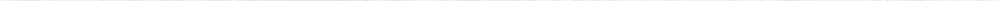

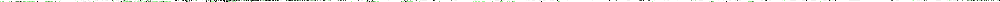

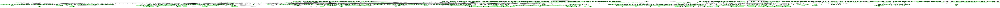

In [ ]:
display(Image(filename=f"{go_output_path}/nbt3102_BP.png", width=1200, height=900))
display(Image(filename=f"{go_output_path}/nbt3102_CC.png", width=1200, height=900))
display(Image(filename=f"{go_output_path}/nbt3102_MF.png", width=1200, height=900))

### 7a. These plots are likely to messy
The *Cellular Component* plot is the smallest plot...
![BIG CC PLOT](images/nbt3102_CC.png)

### 7b. So make a smaller sub-plot
This plot contains GOEA results:
  * GO terms colored by P-value:
    * pval < 0.005 (light red)
    * pval < 0.01 (light orange)
    * pval < 0.05 (yellow)
    * pval > 0.05 (grey) Study terms that are not statistically significant
  * GO terms with study gene counts printed. e.g., "32 genes"

In [ ]:
df = pd.read_excel(f'{go_output_path}/nbt3102.xlsx')

results = {}

top_n_go_terms = 3

# Group by the 'enrichment' column
for enrichment_value, group in df.groupby('NS'):
    # Find the 3 values in the GO column with the highest values in p_fdr_bh
    top_n_p_fdr_bh = group.nsmallest(top_n_go_terms, 'p_fdr_bh')['GO'].tolist()
    
    # Find the 3 values in the GO column with the highest values in study_count
    top_n_study_count = group.nlargest(top_n_go_terms, 'study_count')['GO'].tolist()
    
    # Save results
    results[enrichment_value] = {
        'top_n_p_fdr_bh': top_n_p_fdr_bh,
        'top_n_study_count': top_n_study_count
    }

# Print results
for enrichment_value, result in results.items():
    print(f"Enrichment: {enrichment_value}")
    print(f"  Top {top_n_go_terms} GO by p_fdr_bh: {result['top_n_p_fdr_bh']}")
    print(f"  Top {top_n_go_terms} GO by study_count: {result['top_n_study_count']}")

Enrichment: BP
  Top 3 GO by p_fdr_bh: ['GO:0150099', 'GO:0019941', 'GO:0007131']
  Top 3 GO by study_count: ['GO:0006357', 'GO:0045944', 'GO:0006355']
Enrichment: CC
  Top 3 GO by p_fdr_bh: ['GO:0070369', 'GO:0005730', 'GO:1990907']
  Top 3 GO by study_count: ['GO:0005634', 'GO:0005654', 'GO:0005737']
Enrichment: MF
  Top 3 GO by p_fdr_bh: ['GO:0004937', 'GO:0004062', 'GO:0046975']
  Top 3 GO by study_count: ['GO:0005515', 'GO:0046872', 'GO:0003723']


    3 usr  26 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_MF_RNA_Symbols.png


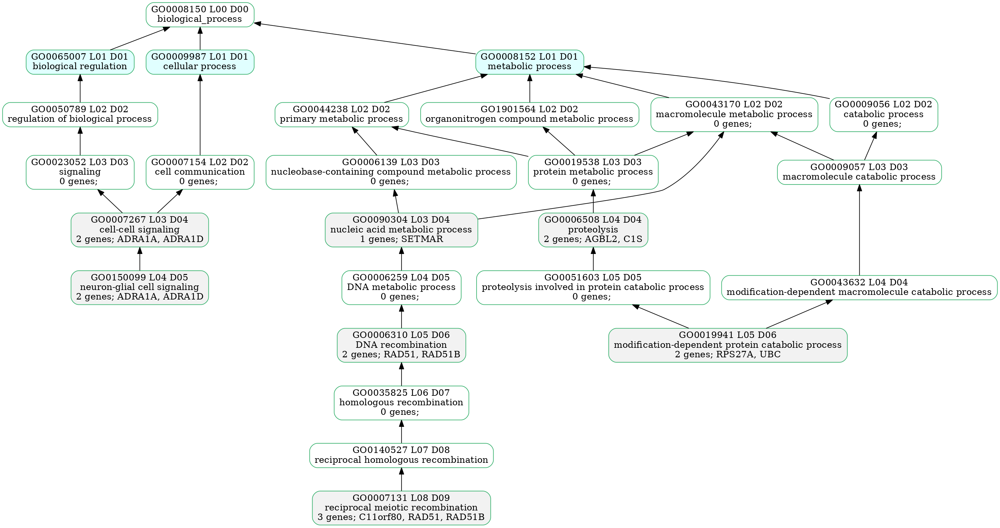

In [ ]:
# Plot subset starting from these significant GO terms
goid_subset = results['BP']['top_n_p_fdr_bh']   # can replace with any other subset above, or any manually selected GO terms

# goid_subset = [
#     'GO:0003723', # MF D04 RNA binding (32 genes)
#     'GO:0044822', # MF D05 poly(A) RNA binding (86 genes)
#     'GO:0003729', # MF D06 mRNA binding (11 genes)
#     'GO:0019843', # MF D05 rRNA binding (6 genes)
#     'GO:0003746', # MF D06 translation elongation factor activity (5 genes)
# ]
plot_gos(f"{go_output_path}/nbt3102_MF_RNA_Symbols.png", 
    goid_subset, # Source GO ids
    obodag,
    goea_results=goea_results_all, # use pvals for coloring
    # We can further configure the plot...
    id2symbol=geneid2symbol, # Print study gene Symbols, not Entrez GeneIDs
    study_items=6, # Only only 6 gene Symbols max on GO terms
    items_p_line=3, # Print 3 genes per line,
    )

display(Image(filename=f"{go_output_path}/nbt3102_MF_RNA_Symbols.png", width=400, height=400))

![RNA subplot](images/nbt3102_MF_RNA_Symbols.png)

In [ ]:
from __future__ import print_function
go_names = [r.name for r in goea_results_sig]
print(len(go_names)) # Includes ONLY signficant results

import collections as cx
word2cnt = cx.Counter([word for name in go_names for word in name.split()])

# Print 10 most common words found in significant GO term names
print(word2cnt.most_common(10))

18492
[('of', 5350), ('regulation', 4474), ('activity', 3678), ('cell', 1737), ('process', 1660), ('positive', 1635), ('negative', 1388), ('to', 1217), ('binding', 1189), ('complex', 1056)]


## Manually select these terms based on the results above

In [ ]:
freq_seen = ['RNA', 'translation', 'mitochond', 'ribosomal', 'ribosome',
             'adhesion', 'endoplasmic', 'nucleotide', 'apoptotic']

In [ ]:
# Collect significant GOs for words in freq_seen (unordered)
word2siggos = cx.defaultdict(set)
# Loop through manually curated words of interest
for word in freq_seen:
    # Check each significant GOEA result for the word of interest
    for rec in goea_results_sig:
        if word in rec.name:
            word2siggos[word].add(rec.GO)
# Sort word2gos to have the same order as words in freq_seen
word2siggos = cx.OrderedDict([(w, word2siggos[w]) for w in freq_seen])

goid2goobj_all = {nt.GO:nt.goterm for nt in goea_results_all}
print(len(goid2goobj_all))

18492


In [ ]:
# Plot set of GOs for each frequently seen word
from goatools.godag_plot import plot_goid2goobj
for word, gos in word2siggos.items():
    goid2goobj = {go:goid2goobj_all[go] for go in gos}
    plot_goid2goobj(
        "{go_output_path}/nbt3102_word_{WORD}.png".format(go_output_path=go_output_path,WORD=word),
        goid2goobj, # source GOs to plot and their GOTerm object
        study_items=15, # Max number of gene symbols to print in each GO term
        id2symbol=geneid2symbol, # Contains GeneID-to-Symbol from Step 1
        goea_results=goea_results_all, # pvals used for GO Term coloring
        dpi=150)
    

max_genes_length = 0
max_genes_word = None
max_genes_list = []

fout = f"{go_output_path}/nbt3102_GO_word_genes.txt"
go2res = {nt.GO:nt for nt in goea_results_all}
with open(fout, "w") as prt:
    for word, gos in word2siggos.items():
        # Sort first by BP, MF, CC. Sort second by GO id.
        gos = sorted(gos, key=lambda go: [go2res[go].NS, go])
        genes = set()
        for go in gos:
            genes |= go2res[go].study_items
        genes = sorted([geneid2symbol[g] for g in genes])

        if len(genes) > max_genes_length:
            max_genes_length = len(genes)
            max_genes_word = word
            max_genes_list = genes

        prt.write("\n{WD}: {N} study genes, {M} GOs\n".format(WD=word, N=len(genes), M=len(gos)))
        prt.write("{WD} GOs: {GOs}\n".format(WD=word, GOs=", ".join(gos)))
        for i, go in enumerate(gos):
            res = go2res[go]
            prt.write("{I}) {NS} {GO} {NAME} ({N} genes)\n".format(
                I=i, NS=res.NS, GO=go, NAME=res.name, N=res.study_count))
        prt.write("{N} study genes:\n".format(N=len(genes)))
        N = 10 # Number of genes per line
        mult = [genes[i:i+N] for i in range(0, len(genes), N)]
        prt.write("  {}\n".format("\n  ".join([", ".join(str(g) for g in sl) for sl in mult])))
    print("  WROTE: {F}\n".format(F=fout))

  749 usr 1271 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_word_RNA.png
  118 usr 291 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_word_translation.png
  251 usr 892 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_word_mitochond.png
   25 usr 108 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_word_ribosomal.png
   26 usr 107 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_word_ribosome.png
  113 usr 195 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_word_adhesion.png
   96 usr 354 GOs  WROTE: /home/jrich/Desktop/CART_prostate_sc/data/output/SAMN10988512_SRX5414523_SRR8615230/data/go/nbt3102_word_endo

The word with the longest list of genes is 'RNA' with 48 genes.
List of genes: ['ARNTL2', 'ASCC1', 'BEND3', 'CALR', 'CIRBP', 'CTCFL', 'DNM1', 'EIF4E', 'ELAVL4', 'FIP1L1', 'FRG1', 'ILF3', 'ISY1', 'JMJD1C', 'MRPL10', 'MSGN1', 'MYC', 'NANOGNB', 'NKX2-1', 'NOC3L', 'NOP2', 'NOP56', 'PABPC3', 'PPIL3', 'REL', 'RPP30', 'RPS16', 'RPS2', 'RPS27A', 'SETD2', 'SLC3A2', 'SUGT1', 'TCF4', 'TCF7L2', 'TET1', 'TSFM', 'TTF1', 'UBC', 'VAX2', 'ZNF195', 'ZNF324', 'ZNF334', 'ZNF410', 'ZNF429', 'ZNF669', 'ZNF701', 'ZNF714', 'ZNF91']


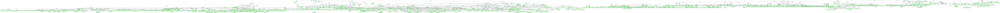

In [ ]:
print(f"The word with the longest list of genes is '{max_genes_word}' with {max_genes_length} genes.")
print(f"List of genes: {max_genes_list}")

display(Image(filename=f"{go_output_path}/nbt3102_word_{max_genes_word}.png", width=400, height=400))

The word with the largest number of GO terms is 'RNA' with 749 terms
List of GO terms: {'GO:0030488', 'GO:0000480', 'GO:0071076', 'GO:0106354', 'GO:0008173', 'GO:0031120', 'GO:0019074', 'GO:0070901', 'GO:0016423', 'GO:0034458', 'GO:0070551', 'GO:0000977', 'GO:0001165', 'GO:0006384', 'GO:0052907', 'GO:0070478', 'GO:0005665', 'GO:0070899', 'GO:0030623', 'GO:0035927', 'GO:0033678', 'GO:0017130', 'GO:0004823', 'GO:0102266', 'GO:0000957', 'GO:0034472', 'GO:2000628', 'GO:0004532', 'GO:0045899', 'GO:0034511', 'GO:1905381', 'GO:0035281', 'GO:0000430', 'GO:1905382', 'GO:0106222', 'GO:0001682', 'GO:1990113', 'GO:0052717', 'GO:1904911', 'GO:0090486', 'GO:0001080', 'GO:0170057', 'GO:0000175', 'GO:0002943', 'GO:0008334', 'GO:0016078', 'GO:0060633', 'GO:0000463', 'GO:0043489', 'GO:0106347', 'GO:0030619', 'GO:0140745', 'GO:0120049', 'GO:0004534', 'GO:0016251', 'GO:0006366', 'GO:0070883', 'GO:0003726', 'GO:0001228', 'GO:1900260', 'GO:0002939', 'GO:0043527', 'GO:0000213', 'GO:2000622', 'GO:0004810', 'G

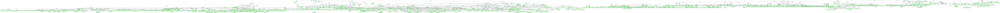

In [ ]:
# Initialize variables to keep track of the key with the largest value length
max_key = None
max_length = 0

# Iterate over the dictionary items
for key, value in word2siggos.items():
    # Check if the current value's length is greater than the max length found so far
    if len(value) > max_length:
        max_length = len(value)
        max_key = key

# Print the key with the largest value length
print(f"The word with the largest number of GO terms is '{max_key}' with {max_length} terms")
print(f"List of GO terms: {word2siggos[max_key]}")

display(Image(filename=f"{go_output_path}/nbt3102_word_{max_key}.png", width=400, height=400))